In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


### **Reading and Understanding Data**

In [2]:
#importing libraries

import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import datetime
import math
import calendar
from math import radians

In [3]:
# Reading the train and test dataset

df_train = pd.read_csv('/content/gdrive/MyDrive/Capstone Dataset/fraudTrain.csv')


In [4]:
df_train.shape

(1296675, 23)

In [5]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   category               1296675 non-null  object 
 5   amt                    1296675 non-null  float64
 6   first                  1296675 non-null  object 
 7   last                   1296675 non-null  object 
 8   gender                 1296675 non-null  object 
 9   street                 1296675 non-null  object 
 10  city                   1296675 non-null  object 
 11  state                  1296675 non-null  object 
 12  zip                    1296675 non-null  int64  
 13  lat                    1296675 non-null  float64
 14  long              

We can see that there are total 23 columns containing many categorical variables, 6 int type variables and 5 float type variables.

In [6]:
df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [7]:
#Checking for duplicate values in the dataset
df_train[df_train.duplicated(keep=False)]


,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud


There are no duplicate values in the data

In [8]:
#Checking for null values in each column
df_train.isnull().sum()

Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

There are no null values in data

In [9]:
#Dropping unnecessary columns
df_train.drop(['Unnamed: 0','cc_num','merchant','category','first','last','street','city','state','zip','job','trans_num','unix_time'],axis=1, inplace=True)

In [10]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 10 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   trans_date_trans_time  1296675 non-null  object 
 1   amt                    1296675 non-null  float64
 2   gender                 1296675 non-null  object 
 3   lat                    1296675 non-null  float64
 4   long                   1296675 non-null  float64
 5   city_pop               1296675 non-null  int64  
 6   dob                    1296675 non-null  object 
 7   merch_lat              1296675 non-null  float64
 8   merch_long             1296675 non-null  float64
 9   is_fraud               1296675 non-null  int64  
dtypes: float64(5), int64(2), object(3)
memory usage: 98.9+ MB


In [11]:
df_train.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,4.97,F,36.0788,-81.1781,3495,1988-03-09,36.011293,-82.048315,0
1,2019-01-01 00:00:44,107.23,F,48.8878,-118.2105,149,1978-06-21,49.159047,-118.186462,0
2,2019-01-01 00:00:51,220.11,M,42.1808,-112.2620,4154,1962-01-19,43.150704,-112.154481,0
3,2019-01-01 00:01:16,45.00,M,46.2306,-112.1138,1939,1967-01-12,47.034331,-112.561071,0
4,2019-01-01 00:03:06,41.96,M,38.4207,-79.4629,99,1986-03-28,38.674999,-78.632459,0


The target variable is is_fraud.
is_fraud = 1 indicates fraud transaction and
is_fraud = 0 indicates not a fraud transaction

In [12]:
#Converting columns to datetime format
df_train['dob'] = pd.to_datetime(df_train['dob'])
df_train['trans_date_trans_time'] = pd.to_datetime(df_train['trans_date_trans_time'])

In [13]:
#Creating new column trans_date and trans_time
df_train['trans_date']= pd.to_datetime(df_train['trans_date_trans_time'], format='%Y:%M:%D').dt.date

In [14]:
df_train['trans_time']= pd.to_datetime(df_train['trans_date_trans_time'], format='%Y:%M:%D').dt.time

In [15]:
#Converting trans_date to datetime format
df_train['trans_date']=pd.to_datetime(df_train['trans_date'])

In [16]:
#Creating new column age
df_train['age'] = round((df_train['trans_date'] - df_train['dob'])/np.timedelta64(1, 'Y'))
df_train['age'] = df_train['age'].astype('int')

In [17]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 13 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   trans_date_trans_time  1296675 non-null  datetime64[ns]
 1   amt                    1296675 non-null  float64       
 2   gender                 1296675 non-null  object        
 3   lat                    1296675 non-null  float64       
 4   long                   1296675 non-null  float64       
 5   city_pop               1296675 non-null  int64         
 6   dob                    1296675 non-null  datetime64[ns]
 7   merch_lat              1296675 non-null  float64       
 8   merch_long             1296675 non-null  float64       
 9   is_fraud               1296675 non-null  int64         
 10  trans_date             1296675 non-null  datetime64[ns]
 11  trans_time             1296675 non-null  object        
 12  age                    12966

In [18]:
#Creating new column trans_month
df_train['trans_month'] = pd.DatetimeIndex(df_train['trans_date_trans_time']).month

In [19]:
#Creating new column trans_day_of_week
def dayfunction(x):
    day = datetime.datetime.weekday(x)
    return (calendar.day_name[day])

df_train['trans_day_of_week'] = df_train['trans_date'].apply(dayfunction)

In [20]:
#Creating function to calculate distance between customer's location and merchant's location
def distanceCalculator(lat1,lon1,lat2,lon2):
    Lat_Dist = radians(lat2 - lat1)
    Long_Dist = radians(lon2 - lon1)

    ans = (pow(math.sin(Lat_Dist / 2), 2) + pow(math.sin(Long_Dist / 2), 2) * math.cos(lat1) * math.cos(lat2));
    radius = 6371
    cal = 2 * math.asin(math.sqrt(ans))
    return radius * cal

Dist = []
for a,b,c,d in zip(df_train['lat'], df_train['long'], df_train['merch_lat'], df_train['merch_long']):
    Dist.append(distanceCalculator(a,b,c,d))

df_train['dist'] = Dist


In [21]:
df_train.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud,trans_date,trans_time,age,trans_month,trans_day_of_week,dist
0,2019-01-01 00:00:18,4.97,F,36.0788,-81.1781,3495,1988-03-09,36.011293,-82.048315,0,2019-01-01,00:00:18,31,1,Tuesday,10.509708
1,2019-01-01 00:00:44,107.23,F,48.8878,-118.2105,149,1978-06-21,49.159047,-118.186462,0,2019-01-01,00:00:44,41,1,Tuesday,30.171468
2,2019-01-01 00:00:51,220.11,M,42.1808,-112.2620,4154,1962-01-19,43.150704,-112.154481,0,2019-01-01,00:00:51,57,1,Tuesday,107.746268
3,2019-01-01 00:01:16,45.00,M,46.2306,-112.1138,1939,1967-01-12,47.034331,-112.561071,0,2019-01-01,00:01:16,52,1,Tuesday,97.629363
4,2019-01-01 00:03:06,41.96,M,38.4207,-79.4629,99,1986-03-28,38.674999,-78.632459,0,2019-01-01,00:03:06,33,1,Tuesday,66.236025


In [22]:
#Dropping unncessary columns
df_train.drop(['trans_date_trans_time','trans_date','trans_time','dob', 'lat','long', 'merch_lat','merch_long'], axis=1, inplace=True)
df_train.head()

,amt,gender,city_pop,is_fraud,age,trans_month,trans_day_of_week,dist
0,4.97,F,3495,0,31,1,Tuesday,10.509708
1,107.23,F,149,0,41,1,Tuesday,30.171468
2,220.11,M,4154,0,57,1,Tuesday,107.746268
3,45.00,M,1939,0,52,1,Tuesday,97.629363
4,41.96,M,99,0,33,1,Tuesday,66.236025


### **Exploratory Data Analysis**

In [30]:
#Creating function for countplot for UNIVARIATE ANALYSIS OF CATEGORICAL VARIABLES FOR EACH TARGET
def count_plot(i):

    plt.rcParams["figure.figsize"] = [12, 6]
    plt.rcParams["figure.autolayout"] = True
    graph1=plt.subplot(1,2,1)
    sns.countplot(x=df_train[df_train["is_fraud"]==0][i])
    plt.xlabel('count')
    plt.title('Count Distribution of '+i+' \nfor fraud=0')
   #compare
    plt.subplot(1,2,2)
    graph2=sns.countplot(x=df_train[df_train["is_fraud"]==1][i])
    plt.xlabel('count')
    plt.title('Count Distribution of '+i+' \nfor fraud=1')

    plt.show()

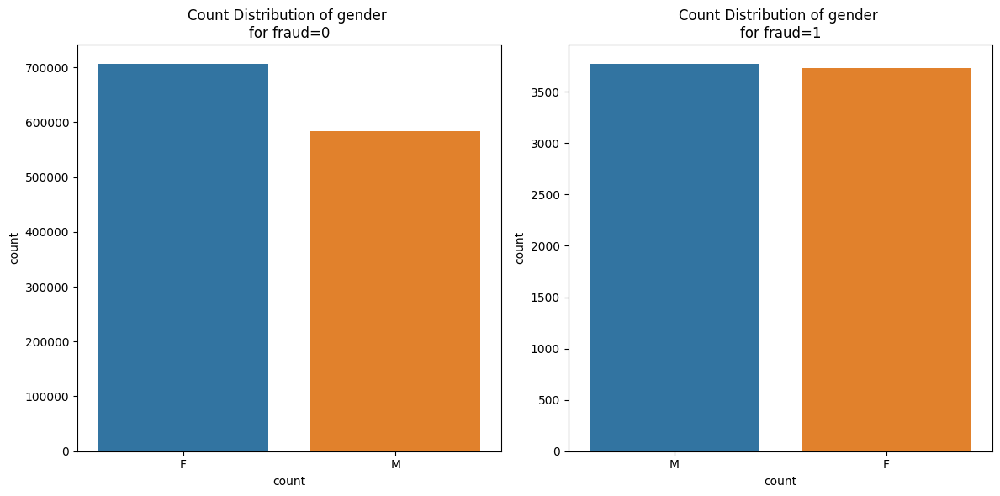

In [31]:
count_plot('gender')

Observations: In general, more transactions are done by female customers but for fraud transactions it is almost same for both genders

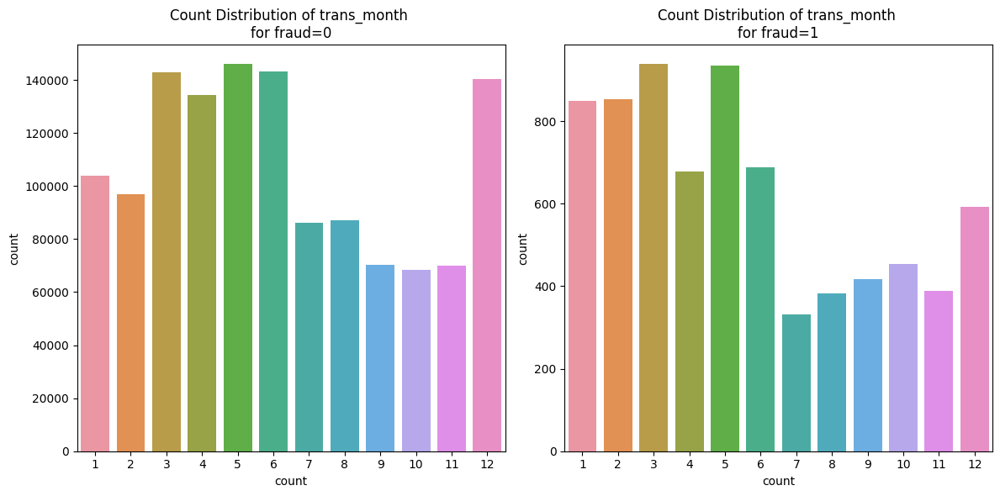

In [32]:
count_plot('trans_month')

Observations: In general, most transactions are done in the 5th  and 3rd i.e., May and March months. Fraud transactions are more common in these months as well

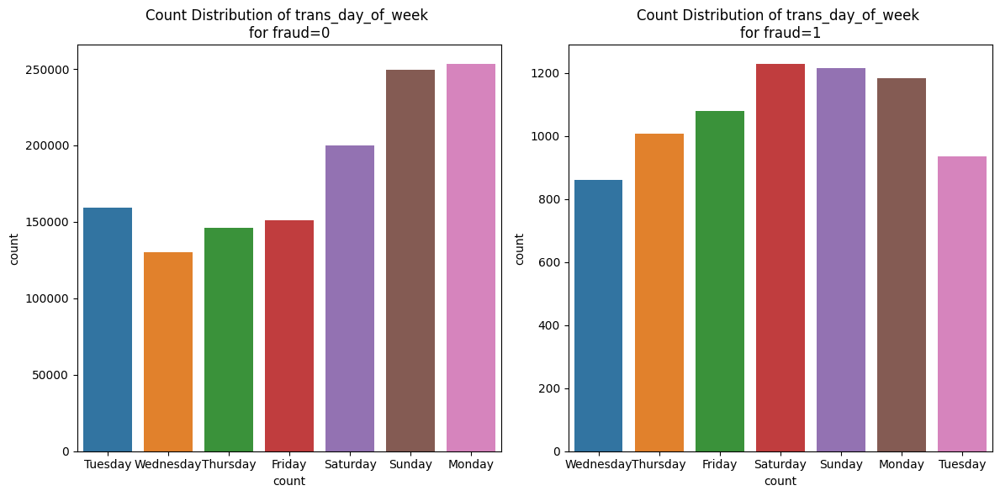

In [33]:
count_plot('trans_day_of_week')

Observations: In general, most transactions are done on Sunday and Monday. Fraud transactions are more common on Saturday, Sunday and Monday

In [34]:
#Converting columns gender and trans_day_of_week to numeric format
df_train['gender'] = df_train['gender'].map({'F':1, 'M':0})
df_train['trans_day_of_week'] = df_train['trans_day_of_week'].map({'Monday':1, 'Tuesday':2, 'Wednesday': 3, 'Thursday': 4,
                                                          'Friday':5, 'Saturday':6, 'Sunday': 7})

In [35]:
df_train.head()

,amt,gender,city_pop,is_fraud,age,trans_month,trans_day_of_week,dist
0,4.97,1,3495,0,31,1,2,10.509708
1,107.23,1,149,0,41,1,2,30.171468
2,220.11,0,4154,0,57,1,2,107.746268
3,45.00,0,1939,0,52,1,2,97.629363
4,41.96,0,99,0,33,1,2,66.236025


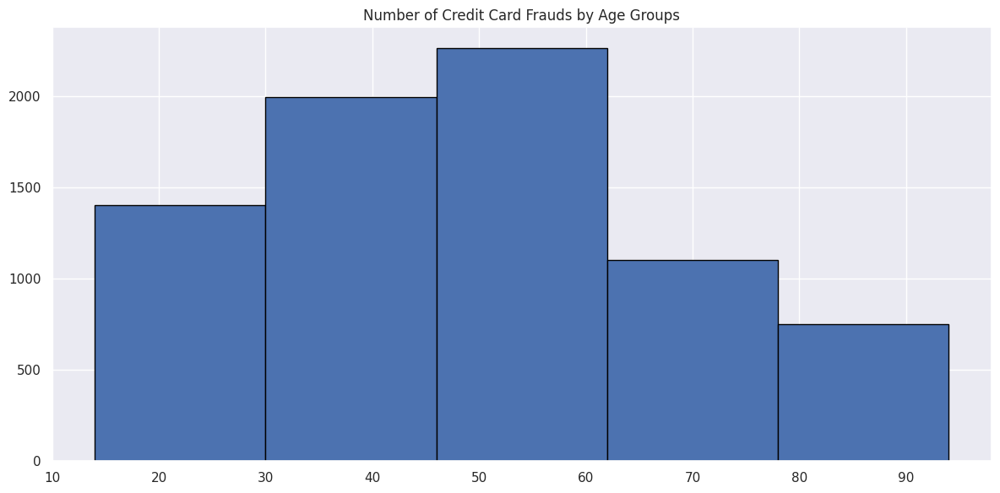

In [45]:
#Univariate analysis for column 'age' for is_fraud = 1 (fraudulent transactions)
fraud=df_train[df_train["is_fraud"]==1]
fig, ax = plt.subplots()
ax.hist(fraud.age, edgecolor = "black", bins = 5)
plt.title("Number of Credit Card Frauds by Age Groups")
plt.show()

Observation: Most amount of fraudulent transaction takes place for age between 30 and 60

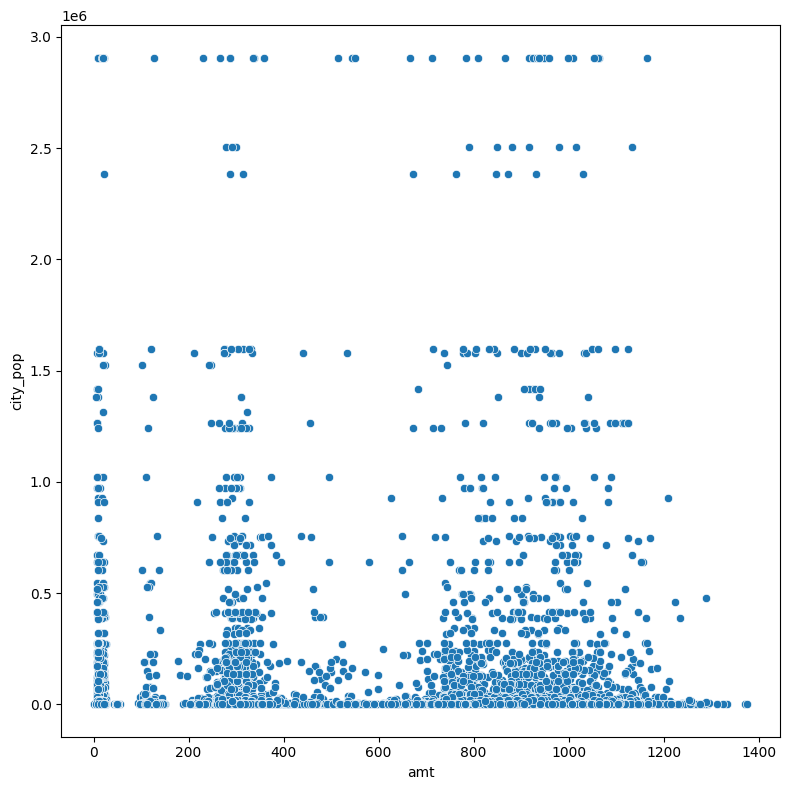

In [36]:
#Checking correlation between columns 'amt' and 'city_pop' with the help scatterplot
plt.figure(figsize = (8,8))
sns.scatterplot(data = df_train[df_train['is_fraud'] == 1], x = 'amt', y = 'city_pop')
plt.show()

Observation: There is no clear relation between 'amt' and 'city_pop'

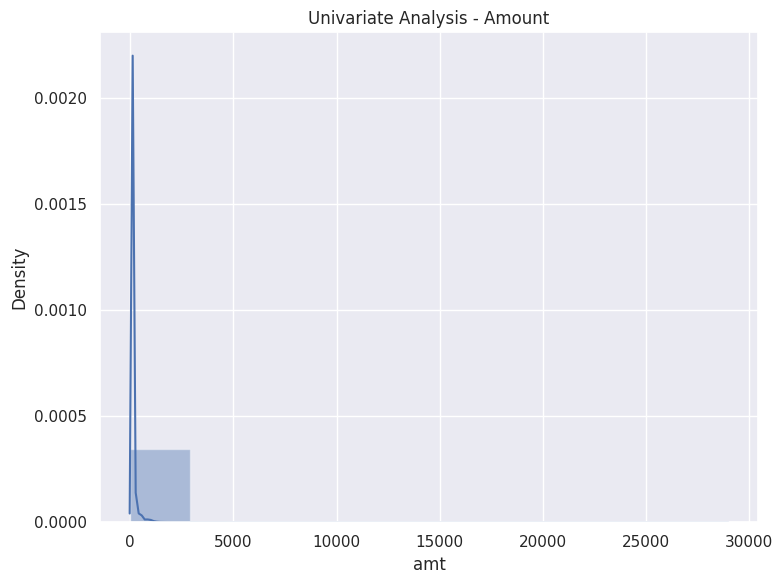

In [37]:
#Univariate Analysis for column 'amt'
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(df_train['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

Observation: The kernel density function clearly shows that 'amt' has major skewness. This can be treated with the help of log transformation

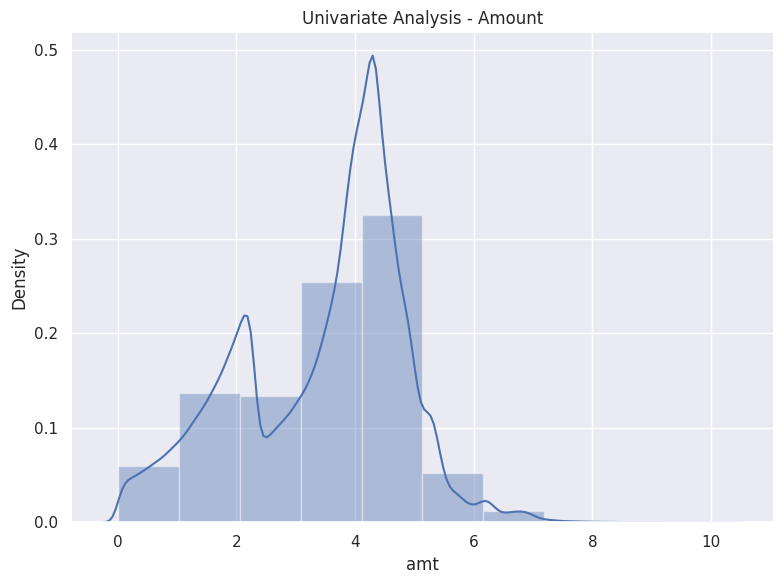

In [38]:
df_train['amt'] = np.log(df_train['amt'])
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(df_train['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

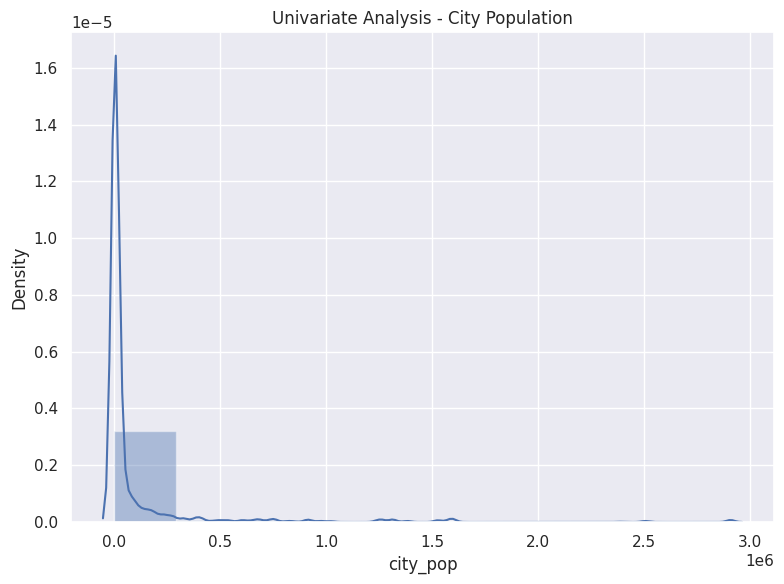

In [40]:
#Univariate Analysis for column 'city_pop'
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(df_train['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - City Population')
plt.show()

Observation: The kernel density function clearly shows that 'city_pop' has major skewness. This can be treated with the help of log transformation

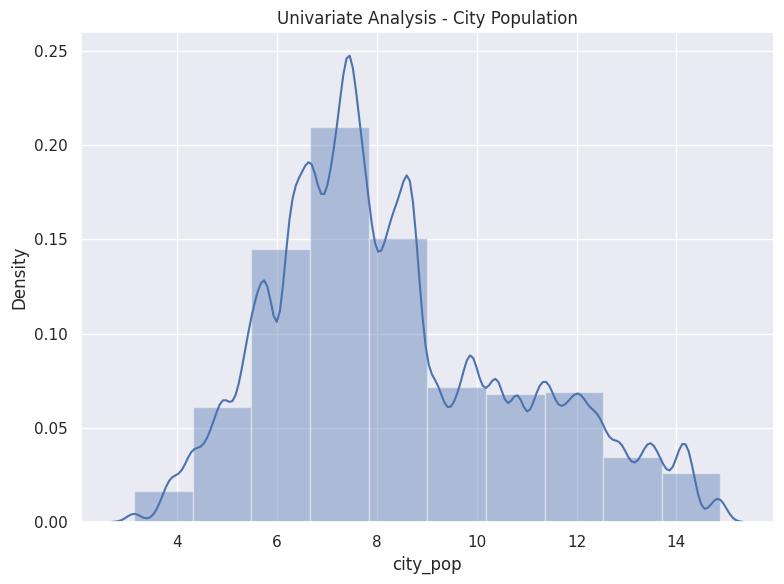

In [41]:
df_train['city_pop'] = np.log(df_train['city_pop'])
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(df_train['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - City Population')
plt.show()

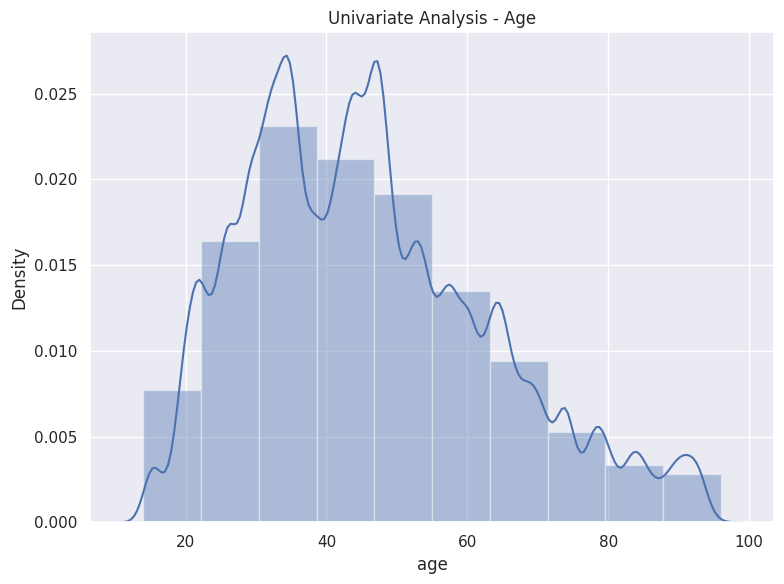

In [43]:
#Univariate Analysis for column 'age'
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(df_train['age'], bins = 10, kde = True)
plt.title('Univariate Analysis - Age')
plt.show()

Observation: There is no skewness in 'age' column

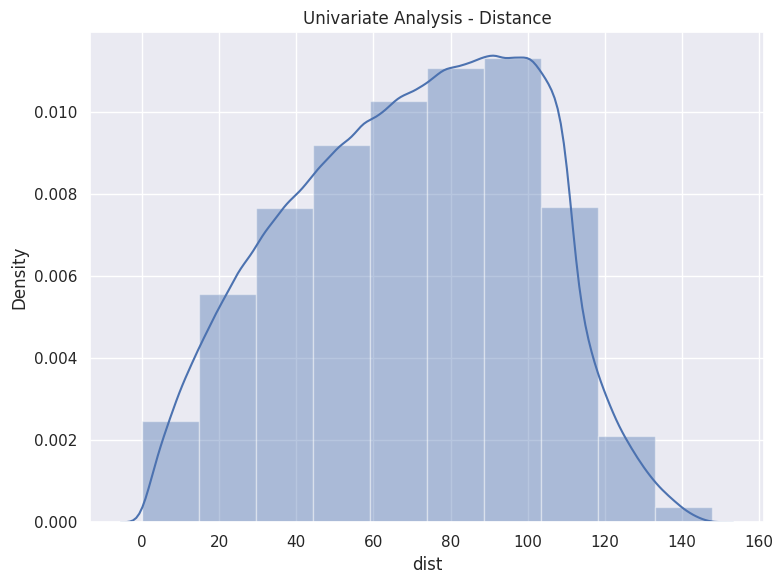

In [44]:
#Univariate Analysis for column 'dist'
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(df_train['dist'], bins = 10, kde = True)
plt.title('Univariate Analysis - Distance')
plt.show()

Observation: There is no skewness in 'dist' column

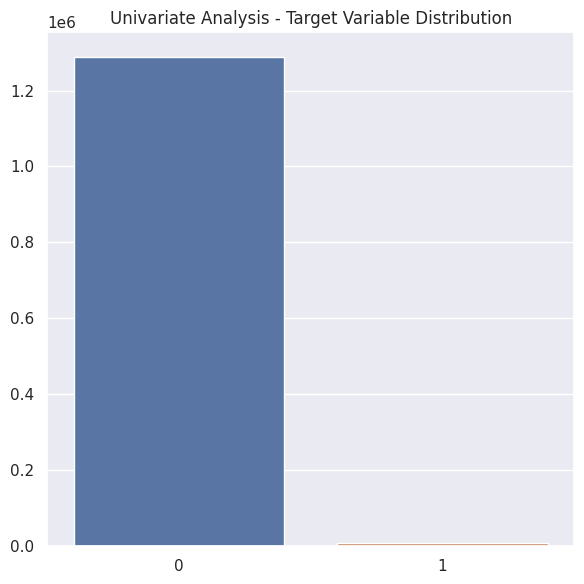

In [46]:
#Class Imbalance check
x = [0, 1]
y = [df_train.is_fraud.value_counts()[0],df_train.is_fraud.value_counts()[1]]

plt.figure(figsize = [6,6])
ax = sns.barplot(x = x, y = y)
plt.title('Univariate Analysis - Target Variable Distribution')
plt.show()

Observation: There is high imbalance in target variable which can be handled by sampling methods

### **Train-Test Split**

In [47]:
y = df_train.pop('is_fraud')
X = df_train

In [48]:
from sklearn import model_selection

#Using the stratify method to handle data imbalance while splitting

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, stratify = y, random_state=42)

In [50]:
#Shape of test and train dataset
X_train.shape, X_test.shape

((972506, 7), (324169, 7))

#### Scaling of variables for logistic regression

In [51]:
df_train.columns

Index(['amt', 'gender', 'city_pop', 'age', 'trans_month', 'trans_day_of_week',
       'dist'],
      dtype='object')

In [52]:
# Making a copy of the X_train and scaling it as that is specific only to Logistic Regression

X_train_lr = X_train.copy()

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_lr[['amt', 'gender', 'city_pop', 'age', 'trans_day_of_week', 'trans_month', 'dist']] = scaler.fit_transform(X_train[['amt', 'gender', 'city_pop', 'age', 'trans_day_of_week', 'trans_month', 'dist']])
X_train_lr.head()

,amt,gender,city_pop,age,trans_month,trans_day_of_week,dist
267436,0.482372,0.0,0.448670,0.353659,0.363636,1.000000,0.376031
233159,0.251400,1.0,0.230283,0.463415,0.272727,0.833333,0.642221
430072,0.441626,0.0,0.470635,0.560976,0.545455,0.666667,0.718947
236662,0.474693,1.0,0.698418,0.414634,0.272727,1.000000,0.510120
450357,0.462170,0.0,0.477590,0.841463,0.545455,0.666667,0.540952


In [54]:
X_train_lr.describe()

,amt,gender,city_pop,age,trans_month,trans_day_of_week,dist
count,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000
mean,0.338391,0.546699,0.444523,0.390205,0.467545,0.511807,0.473872
std,0.135778,0.497815,0.208761,0.212136,0.310577,0.366377,0.206361
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.221962,0.000000,0.295607,0.231707,0.181818,0.166667,0.314929
50%,0.377921,1.000000,0.397163,0.365854,0.454545,0.500000,0.488222
75%,0.432530,1.000000,0.577530,0.524390,0.727273,0.833333,0.640732
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### **Model Building & Hyperparameter Tuning**

We will try to build following models without using sampling and by also using sampling methods such as SMOTE and ADASYN:


1.   Logistic Regression
2.   Decision Tree
3.  Random Forest
4.  XGBoost

**Model Evaluation**
: Since it is important to identify which transactions are fraudulent transactions more accurately than identifying non-fraudulent transactions, we will use recall for metric evaluation.





### **1.Logistic Regression**








#### **(a) without using sampling method**

In [56]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.feature_selection import RFE
import statsmodels.api as sm

In [57]:
logreg_unsampled = LogisticRegression().fit(X_train_lr,y_train)

Hyperparameter Tuning using grid search cv

In [58]:
from sklearn.model_selection import GridSearchCV

In [59]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_1 = GridSearchCV(estimator=logreg_unsampled,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [60]:
%%time
grid_search_1.fit(X_train_lr, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
CPU times: user 2.3 s, sys: 1.33 s, total: 3.63 s
Wall time: 56 s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [61]:
grid_search_1.best_score_

0.0

Model Evaluation


In [62]:
def evaluate_model_lr_unsampled(classifier):
    y_train_pred = classifier.predict(X_train_lr)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(metrics.recall_score(y_train, y_train_pred))
    print(metrics.confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [63]:
lr_unsampled = grid_search_1.best_estimator_
evaluate_model_lr_unsampled(lr_unsampled)

Train set performance:
0.0
[[966877      0]
 [  5629      0]]
-------------------------
Test set performance:
0.9952051145444859
[[  9693 312599]
 [     9   1868]]


ROC Curve

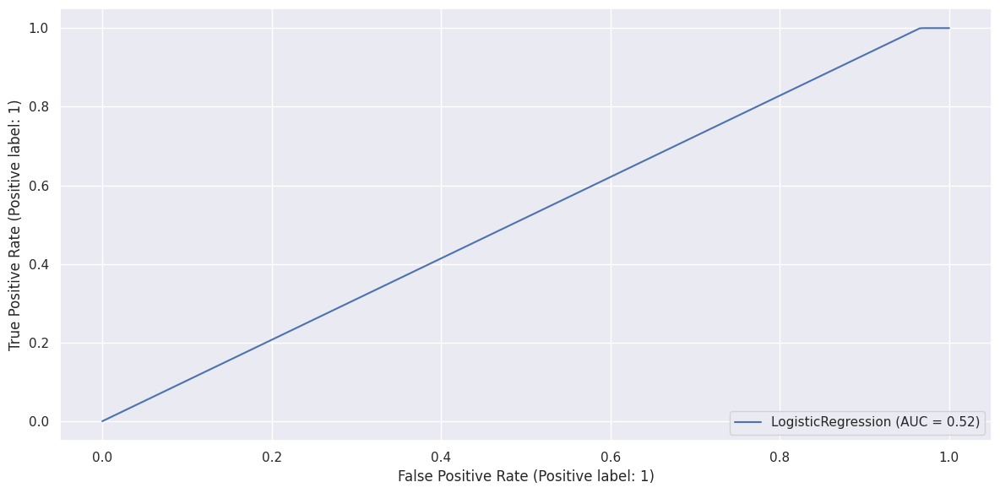

In [70]:
from sklearn.metrics import RocCurveDisplay, classification_report
metrics.RocCurveDisplay.from_estimator(logreg_unsampled, X_test, y_test)
plt.show()

#### **(b)Logistic Regression using SMOTE**

**Importing necessary libraries for SMOTE and ADASYN sampling methods**

In [71]:
from imblearn.over_sampling import SMOTE, ADASYN

In [72]:
X_train_smote_lr, y_train_smote_lr = SMOTE().fit_resample(X_train_lr, y_train)

In [73]:
logreg_smote = LogisticRegression().fit(X_train_smote_lr,y_train_smote_lr)

Hyperparameter Tuning using grid search cv

In [74]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_2 = GridSearchCV(estimator=logreg_smote,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [75]:
%%time
grid_search_2.fit(X_train_smote_lr, y_train_smote_lr)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
CPU times: user 5.74 s, sys: 2.11 s, total: 7.85 s
Wall time: 1min 55s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [76]:
grid_search_2.best_score_

0.779919267224195

Model Evaluation

In [77]:
def evaluate_model_lr_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote_lr)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(metrics.recall_score(y_train_smote_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_smote_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [78]:
lr_smote = grid_search_2.best_estimator_
evaluate_model_lr_smote(lr_smote)

Train set performance:
0.779921334357938
[[778470 188407]
 [212789 754088]]
-------------------------
Test set performance:
1.0
[[     0 322292]
 [     0   1877]]


ROC Curve

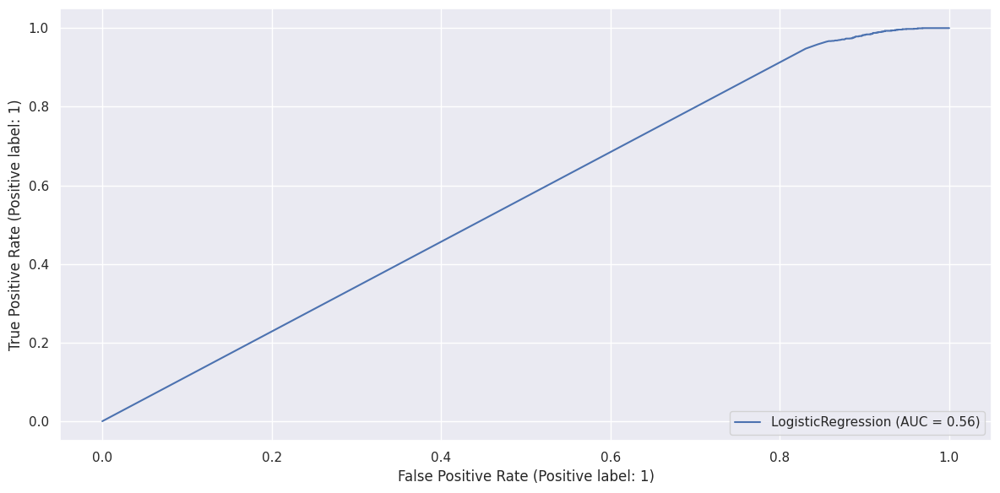

In [80]:
metrics.RocCurveDisplay.from_estimator(logreg_smote, X_test, y_test)
plt.show()

#### **(c)Logistic Regression using ADASYN**

In [81]:
X_train_adasyn_lr, y_train_adasyn_lr = ADASYN().fit_resample(X_train_lr, y_train)

In [82]:
logreg_adasyn = LogisticRegression().fit(X_train_adasyn_lr,y_train_adasyn_lr)

Hyperparameter Tuning using grid search cv

In [83]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_3 = GridSearchCV(estimator=logreg_adasyn,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [84]:
%%time
grid_search_3.fit(X_train_adasyn_lr, y_train_adasyn_lr)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
CPU times: user 4.67 s, sys: 1.97 s, total: 6.64 s
Wall time: 1min 17s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [85]:
grid_search_3.best_score_

0.7314427603331437

Model Evaluation

In [86]:
def evaluate_model_lr_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn_lr)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(metrics.recall_score(y_train_adasyn_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_adasyn_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [87]:
lr_adasyn = grid_search_3.best_estimator_
evaluate_model_lr_adasyn(lr_adasyn)

Train set performance:
0.7314541410170193
[[724955 241922]
 [259563 706987]]
-------------------------
Test set performance:
1.0
[[     8 322284]
 [     0   1877]]


ROC Curve

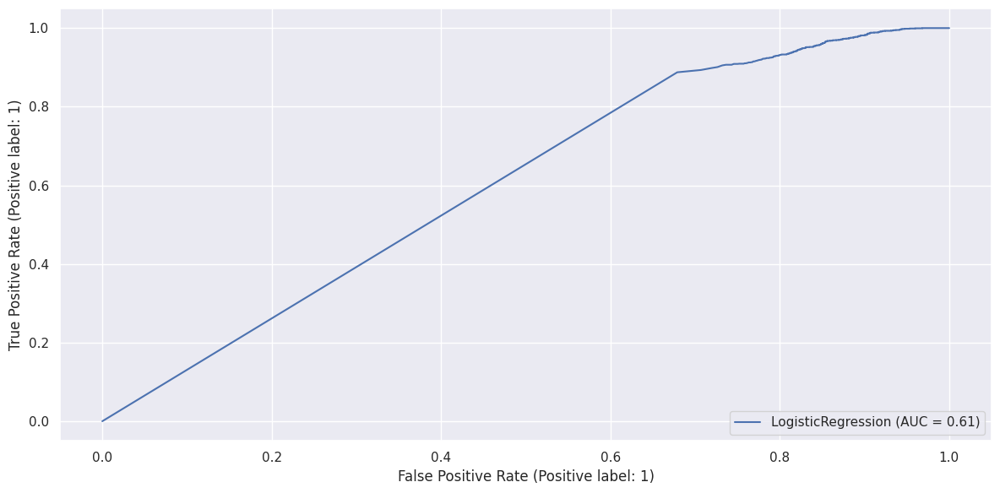

In [88]:
metrics.RocCurveDisplay.from_estimator(logreg_adasyn, X_test, y_test)
plt.show()

### **2. Decision Tree**

In [89]:
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score

Defining Helper Functions

In [90]:
def get_graph(classifier):
    dot_data = StringIO()

    export_graphviz(classifier, out_file = dot_data, filled = True, rounded = True,
               feature_names=X.columns,
               class_names=['No Fraud', 'Fraud'])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

#### **(a)Decision Tree without using sampling mehod**

In [91]:
def evaluate_model_unsampled(classifier):
    y_train_pred = classifier.predict(X_train)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(recall_score(y_train, y_train_pred))
    print(confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

Hyperparameter Tuning using grid search cv

In [92]:
dt_unsampled = DecisionTreeClassifier(random_state=42).fit(X_train,y_train)

In [93]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_4 = GridSearchCV(estimator=dt_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [94]:
%%time
grid_search_4.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 10.5 s, sys: 1.72 s, total: 12.3 s
Wall time: 8min 16s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [95]:
grid_search_4.best_score_


0.33167744227353463

In [96]:
dt_best = grid_search_4.best_estimator_
evaluate_model_unsampled(dt_best)

Train set performance:
0.30982412506661927
[[966063    814]
 [  3885   1744]]
-------------------------
Test set performance:
0.2855620671283964
[[321988    304]
 [  1341    536]]


In [97]:
grid_search_4.best_params_

{'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 80}

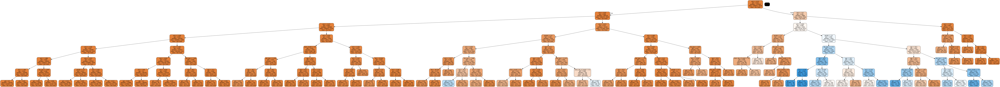

In [98]:
gph = get_graph(dt_best)
Image(gph.create_png())

ROC Curve

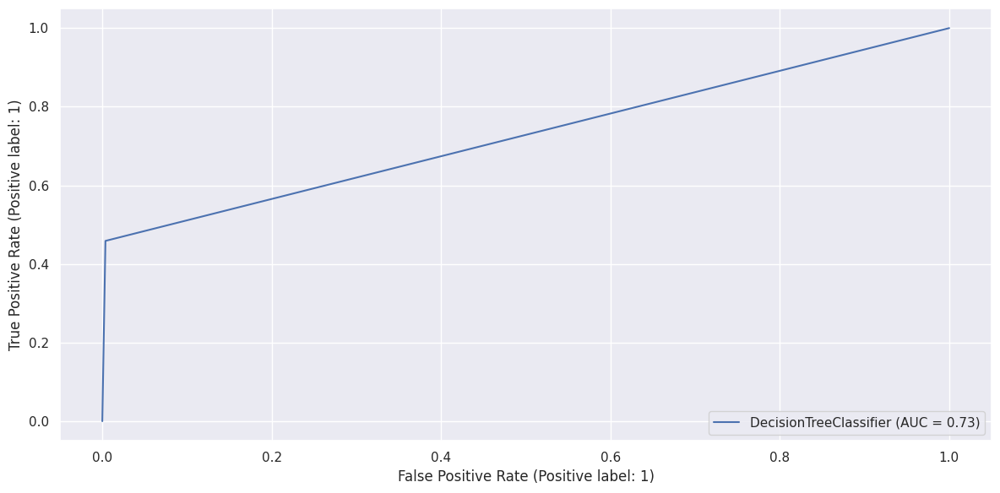

In [100]:
metrics.RocCurveDisplay.from_estimator(dt_unsampled, X_test, y_test)
plt.show()

#### **(b)Decision Tree using SMOTE**

In [101]:
X_train_smote, y_train_smote = SMOTE().fit_resample(X_train, y_train)

In [102]:
dt_smote = DecisionTreeClassifier(random_state=42).fit(X_train_smote,y_train_smote)

In [103]:
def evaluate_model_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(recall_score(y_train_smote, y_train_pred))
    print(confusion_matrix(y_train_smote, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

Hyperparameter Tuning using grid search cv

In [104]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_5 = GridSearchCV(estimator=dt_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [105]:
%%time
grid_search_5.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 23.1 s, sys: 1.67 s, total: 24.8 s
Wall time: 14min 36s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [106]:
grid_search_5.best_score_

0.8577874941875832

In [107]:
dt_smote = grid_search_5.best_estimator_
evaluate_model_smote(dt_smote)


Train set performance:
0.8600959584311137
[[890727  76150]
 [135270 831607]]
-------------------------
Test set performance:
0.8199254128929142
[[296647  25645]
 [   338   1539]]


In [108]:
grid_search_5.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 50}

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.342877 to fit



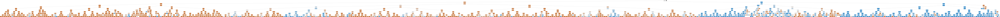

In [109]:
gph = get_graph(dt_smote)
Image(gph.create_png())

ROC Curve

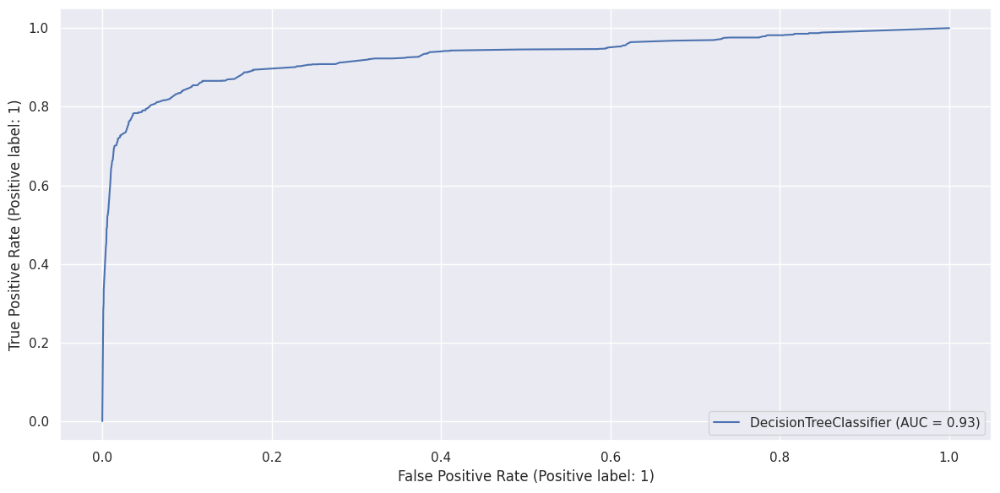

In [110]:
metrics.RocCurveDisplay.from_estimator(dt_smote, X_test, y_test)
plt.show()

#### **(c)Decision Tree using ADASYN**

In [111]:
X_train_adasyn, y_train_adasyn = ADASYN().fit_resample(X_train, y_train)

In [112]:
def evaluate_model_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn)
    y_test_pred = classifier.predict(X_test)

    print('Train set performance:')
    print(recall_score(y_train_adasyn, y_train_pred))
    print(confusion_matrix(y_train_adasyn, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

In [113]:
dt_adasyn = DecisionTreeClassifier(random_state=42).fit(X_train_adasyn,y_train_adasyn)

Hyperparameter Tuning using grid search cv

In [114]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_6 = GridSearchCV(estimator=dt_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [115]:
%%time
grid_search_6.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 22.3 s, sys: 1.78 s, total: 24.1 s
Wall time: 15min 42s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [116]:
grid_search_6.best_score_

0.8482860898482109

In [117]:
dt_adasyn = grid_search_6.best_estimator_
evaluate_model_adasyn(dt_adasyn)

Train set performance:
0.8546100351685854
[[886528  80349]
 [140931 828400]]
-------------------------
Test set performance:
0.8289824187533298
[[295453  26839]
 [   321   1556]]


In [118]:
grid_search_6.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 60}

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.372086 to fit



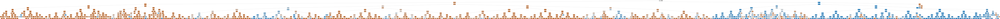

In [119]:
gph = get_graph(dt_adasyn)
Image(gph.create_png())

ROC Curve

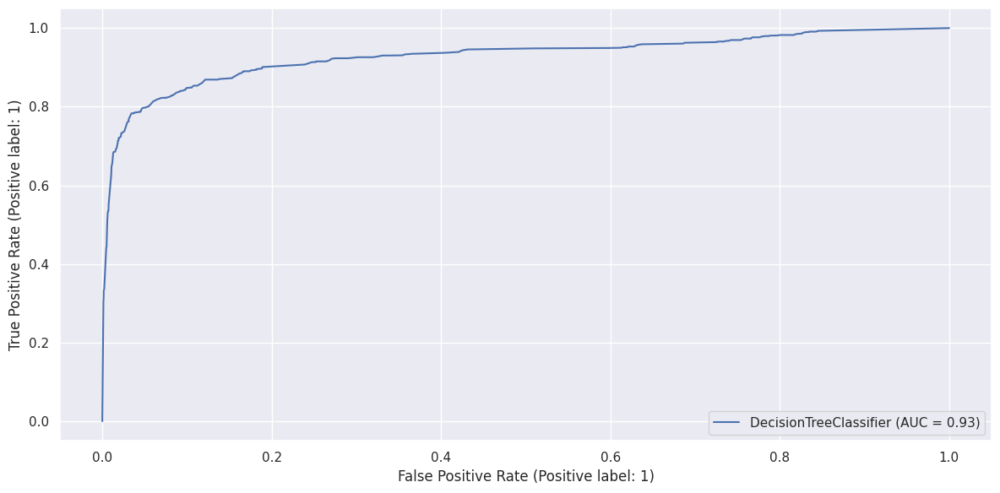

In [120]:
metrics.RocCurveDisplay.from_estimator(dt_adasyn, X_test, y_test)
plt.show()

### **3.Random Forest**

#### **(a)Random Forest without using sampling method**

In [121]:
from sklearn.ensemble import RandomForestClassifier

In [122]:
rf_unsampled = RandomForestClassifier(random_state=42).fit(X_train, y_train)

Hyperparameter Tuning using grid search cv

In [123]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:


params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_7 = GridSearchCV(estimator=rf_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [124]:
%%time
grid_search_7.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 54.6 s, sys: 2.49 s, total: 57.1 s
Wall time: 19min 39s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [125]:
rf_best = grid_search_7.best_estimator_
evaluate_model_unsampled(rf_best)

Train set performance:
0.2654112631017943
[[966481    396]
 [  4135   1494]]
-------------------------
Test set performance:
0.229621736814065
[[322137    155]
 [  1446    431]]


In [126]:
grid_search_7.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

ROC Curve

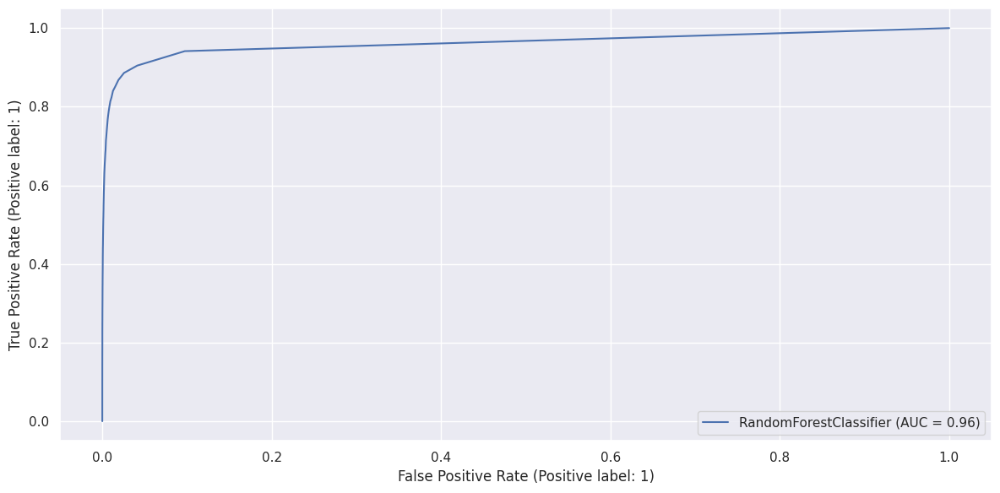

In [128]:
metrics.RocCurveDisplay.from_estimator(rf_unsampled, X_test, y_test)
plt.show()

#### **(b)Random Forest using SMOTE**

In [129]:
rf_smote = RandomForestClassifier(random_state=42).fit(X_train_smote, y_train_smote)

Hyperparameter Tuning using grid search cv

In [130]:
params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_8 = GridSearchCV(estimator=rf_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [131]:
%%time
grid_search_8.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 1min 14s, sys: 4.62 s, total: 1min 18s
Wall time: 44min 15s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [132]:
rf_smote = grid_search_8.best_estimator_
evaluate_model_smote(rf_smote)

Train set performance:
0.8204187295798742
[[927269  39608]
 [173633 793244]]
-------------------------
Test set performance:
0.7874267448055408
[[308996  13296]
 [   399   1478]]


In [133]:
grid_search_8.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 80,
 'n_estimators': 15}

ROC Curve

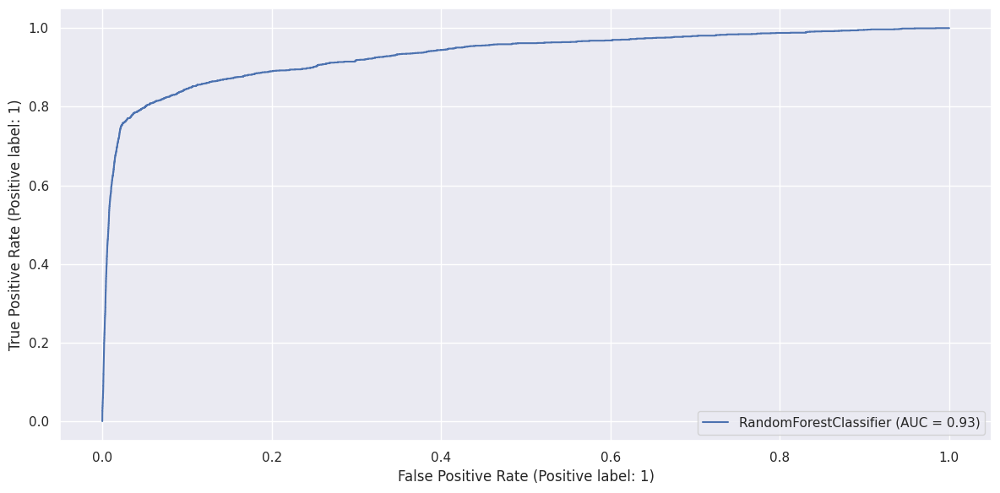

In [134]:
metrics.RocCurveDisplay.from_estimator(rf_smote, X_test, y_test)
plt.show()

#### **(c)Random Forest using ADASYN**

In [135]:
rf_adasyn = RandomForestClassifier(random_state=42).fit(X_train_adasyn, y_train_adasyn)

Hyperparameter Tuning using grid search cv

In [136]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:

params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_9 = GridSearchCV(estimator=rf_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [137]:
%%time
grid_search_9.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 56.2 s, sys: 4.47 s, total: 1min
Wall time: 42min 11s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [138]:
grid_search_9.best_score_

0.8166745963377204

In [139]:
rf_adasyn = grid_search_9.best_estimator_
evaluate_model_adasyn(rf_adasyn)

Train set performance:
0.8152478358785595
[[925876  41001]
 [179086 790245]]
-------------------------
Test set performance:
0.7906233351092168
[[308460  13832]
 [   393   1484]]


In [140]:
grid_search_9.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 10}

ROC Curve

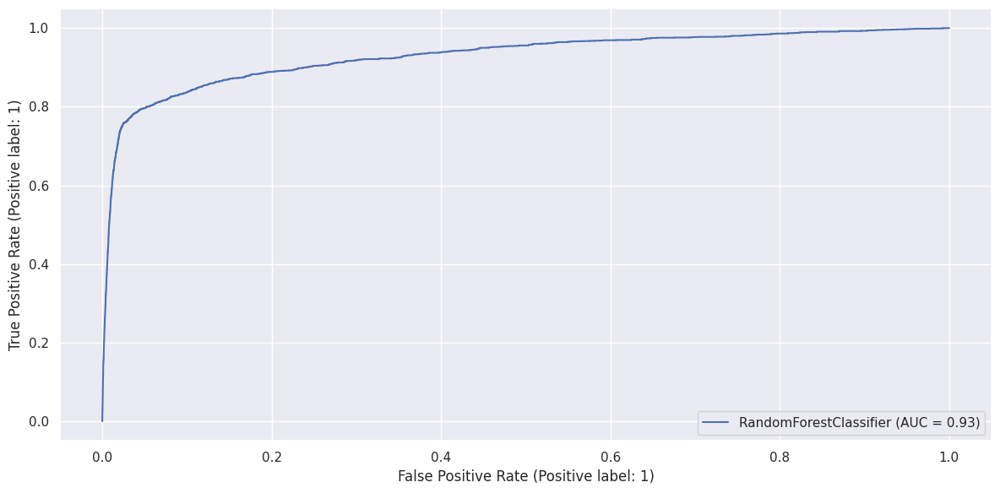

In [141]:
metrics.RocCurveDisplay.from_estimator(rf_adasyn, X_test, y_test)
plt.show()

### **4.XGBoost**

#### **(a)XGBoost without using sampling method**

In [142]:
from xgboost import XGBClassifier

In [143]:
xgb_unsampled = XGBClassifier().fit(X_train, y_train)

Hyperparameter Tuning using grid search cv

In [144]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1,0.3,0.5]
}

grid_search_10 = GridSearchCV(estimator=xgb_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [145]:
%%time
grid_search_10.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 9.79 s, sys: 856 ms, total: 10.6 s
Wall time: 2min 55s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'],
                         'learning_rate': [0.1, 0.3, 0.5], 'max_depth': [10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [146]:
xgb_best_unsampled = grid_search_10.best_estimator_
evaluate_model_unsampled(xgb_best_unsampled)

Train set performance:
0.7003020074613608
[[966719    158]
 [  1687   3942]]
-------------------------
Test set performance:
0.4938732019179542
[[322062    230]
 [   950    927]]


In [147]:
grid_search_10.best_params_

{'criterion': 'gini',
 'learning_rate': 0.5,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

ROC Curve

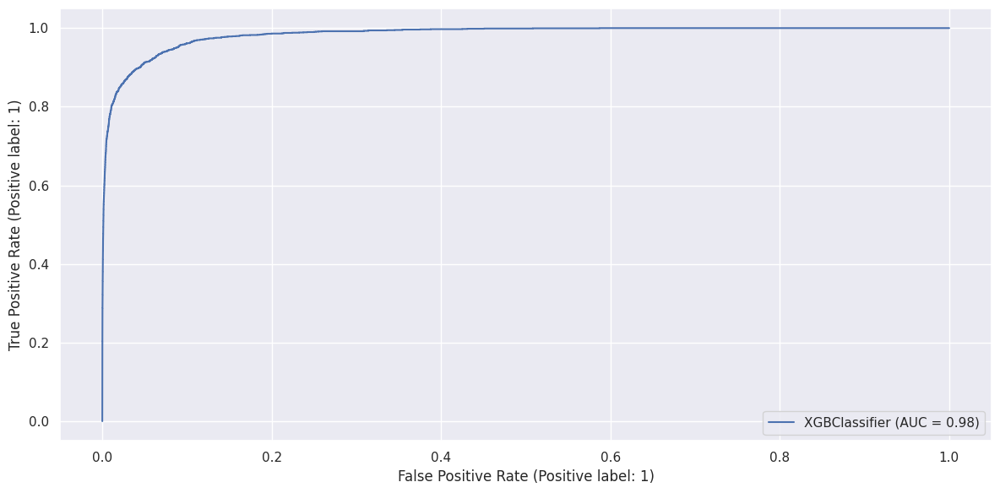

In [148]:
metrics.RocCurveDisplay.from_estimator(xgb_unsampled, X_test, y_test)
plt.show()

#### **(b)XGBoost using SMOTE**

In [149]:
xgb_smote = XGBClassifier().fit(X_train_smote, y_train_smote)

Hyperparameter Tuning using grid search cv

In [150]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_11 = GridSearchCV(estimator=xgb_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [151]:
%%time
grid_search_11.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
CPU times: user 18.7 s, sys: 814 ms, total: 19.6 s
Wall time: 2min 32s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'], 'learning_rate': [0.1],
                         'max_depth': [10], 'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [152]:
xgb_best_smote = grid_search_11.best_estimator_
evaluate_model_smote(xgb_best_smote)

Train set performance:
0.8694839157410922
[[913285  53592]
 [126193 840684]]
-------------------------
Test set performance:
0.8018114011720832
[[303884  18408]
 [   372   1505]]


In [153]:
grid_search_11.best_params_

{'criterion': 'gini',
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

ROC Curve

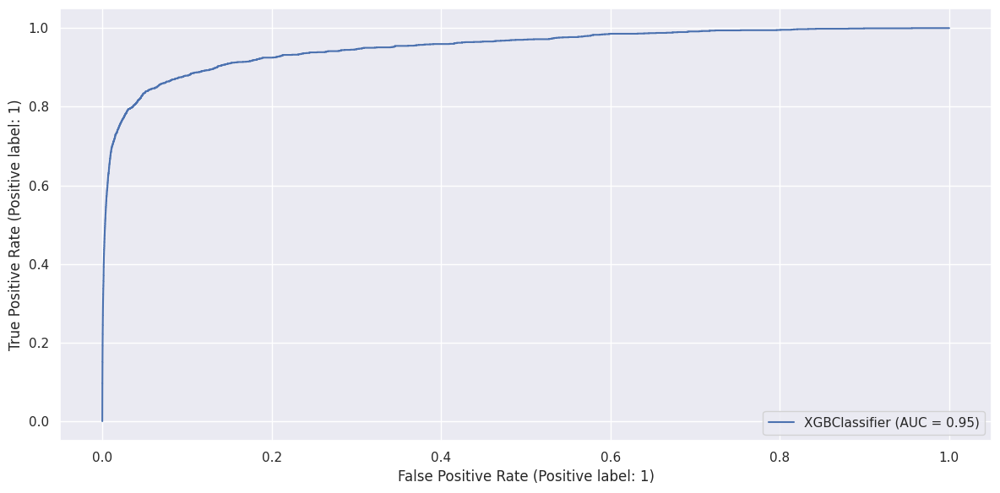

In [154]:
metrics.RocCurveDisplay.from_estimator(xgb_smote, X_test, y_test)
plt.show()

#### **(c)XGBoost using ADASYN**

In [155]:
xgb_adasyn = XGBClassifier().fit(X_train_adasyn, y_train_adasyn)

Hyperparameter Tuning using grid search cv

In [156]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_12 = GridSearchCV(estimator=xgb_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [157]:
%%time
grid_search_12.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
CPU times: user 17.1 s, sys: 554 ms, total: 17.6 s
Wall time: 2min 18s


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'criterion': ['gini'], 'learning_rate': [0.1],
                         'max_depth': [10], 'min_samples_leaf': [50, 80],
                         'n_estimators': [15, 30]},
             scoring='recall', verbose=1)

In [158]:
xgb_best_adasyn = grid_search_12.best_estimator_
evaluate_model_adasyn(xgb_best_adasyn)

Train set performance:
0.8663820717587697
[[910106  56771]
 [129520 839811]]
-------------------------
Test set performance:
0.8098028769312733
[[302894  19398]
 [   357   1520]]


In [159]:
grid_search_12.best_params_

{'criterion': 'gini',
 'learning_rate': 0.1,
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 30}

ROC Curve

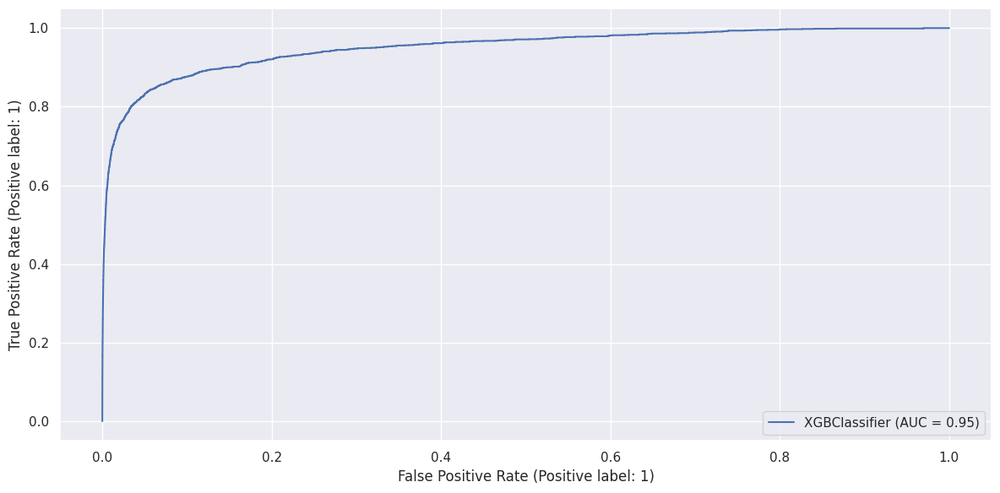

In [160]:
metrics.RocCurveDisplay.from_estimator(xgb_adasyn, X_test, y_test)
plt.show()

### **Testing results on unseen test data**

In [161]:
#Reading fraudTest.csv to check models on unseen data
df_test = pd.read_csv('/content/gdrive/MyDrive/Capstone Dataset/fraudTest.csv')

In [162]:
df_test.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2020-06-21 12:14:25,2291163933867244,fraud_Kirlin and Sons,personal_care,2.86,Jeff,Elliott,M,351 Darlene Green,...,33.9659,-80.9355,333497,Mechanical engineer,1968-03-19,2da90c7d74bd46a0caf3777415b3ebd3,1371816865,33.986391,-81.200714,0
1,1,2020-06-21 12:14:33,3573030041201292,fraud_Sporer-Keebler,personal_care,29.84,Joanne,Williams,F,3638 Marsh Union,...,40.3207,-110.4360,302,"Sales professional, IT",1990-01-17,324cc204407e99f51b0d6ca0055005e7,1371816873,39.450498,-109.960431,0
2,2,2020-06-21 12:14:53,3598215285024754,"fraud_Swaniawski, Nitzsche and Welch",health_fitness,41.28,Ashley,Lopez,F,9333 Valentine Point,...,40.6729,-73.5365,34496,"Librarian, public",1970-10-21,c81755dbbbea9d5c77f094348a7579be,1371816893,40.495810,-74.196111,0
3,3,2020-06-21 12:15:15,3591919803438423,fraud_Haley Group,misc_pos,60.05,Brian,Williams,M,32941 Krystal Mill Apt. 552,...,28.5697,-80.8191,54767,Set designer,1987-07-25,2159175b9efe66dc301f149d3d5abf8c,1371816915,28.812398,-80.883061,0
4,4,2020-06-21 12:15:17,3526826139003047,fraud_Johnston-Casper,travel,3.19,Nathan,Massey,M,5783 Evan Roads Apt. 465,...,44.2529,-85.0170,1126,Furniture designer,1955-07-06,57ff021bd3f328f8738bb535c302a31b,1371816917,44.959148,-85.884734,0


In [163]:
#Dropping unnecessary columns
df_test.drop(['Unnamed: 0','cc_num','merchant','category','first','last','street','city','state','zip','job','trans_num','unix_time'],axis=1, inplace=True)

In [164]:
df_test.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud
0,2020-06-21 12:14:25,2.86,M,33.9659,-80.9355,333497,1968-03-19,33.986391,-81.200714,0
1,2020-06-21 12:14:33,29.84,F,40.3207,-110.4360,302,1990-01-17,39.450498,-109.960431,0
2,2020-06-21 12:14:53,41.28,F,40.6729,-73.5365,34496,1970-10-21,40.495810,-74.196111,0
3,2020-06-21 12:15:15,60.05,M,28.5697,-80.8191,54767,1987-07-25,28.812398,-80.883061,0
4,2020-06-21 12:15:17,3.19,M,44.2529,-85.0170,1126,1955-07-06,44.959148,-85.884734,0


In [165]:
#Converting columns to datetime format
df_test['dob'] = pd.to_datetime(df_test['dob'])
df_test['trans_date_trans_time'] = pd.to_datetime(df_test['trans_date_trans_time'])

In [166]:
#Creating new column trans_date and trans_time
df_test['trans_date']= pd.to_datetime(df_test['trans_date_trans_time'], format='%Y:%M:%D').dt.date

In [167]:
df_test['trans_time']= pd.to_datetime(df_test['trans_date_trans_time'], format='%Y:%M:%D').dt.time

In [168]:
#Converting trans_date to datetime format
df_test['trans_date']=pd.to_datetime(df_test['trans_date'])

In [169]:
#Creating new column age
df_test['age'] = round((df_test['trans_date'] - df_test['dob'])/np.timedelta64(1, 'Y'))
df_test['age'] = df_test['age'].astype('int')

In [170]:
#Creating new column trans_month
df_test['trans_month'] = pd.DatetimeIndex(df_test['trans_date_trans_time']).month

In [171]:
#Creating new column trans_day_of_week

df_test['trans_day_of_week'] = df_test['trans_date'].apply(dayfunction)

In [172]:
#Using function to calculate distance between customer's location and merchant's location

Dist2 = []
for a,b,c,d in zip(df_test['lat'], df_test['long'], df_test['merch_lat'], df_test['merch_long']):
    Dist2.append(distanceCalculator(a,b,c,d))

df_test['dist'] = Dist2


In [173]:
#Dropping unncessary columns
df_test.drop(['trans_date_trans_time','trans_date','trans_time','dob', 'lat','long', 'merch_lat','merch_long'], axis=1, inplace=True)
df_test.head()

,amt,gender,city_pop,is_fraud,age,trans_month,trans_day_of_week,dist
0,2.86,M,333497,0,52,6,Sunday,24.748687
1,29.84,F,302,0,30,6,Sunday,98.988771
2,41.28,F,34496,0,50,6,Sunday,73.344386
3,60.05,M,54767,0,33,6,Sunday,27.746011
4,3.19,M,1126,0,65,6,Sunday,105.772207


In [174]:
#Converting columns gender and trans_day_of_week to numeric format
df_test['gender'] = df_test['gender'].map({'F':1, 'M':0})
df_test['trans_day_of_week'] = df_test['trans_day_of_week'].map({'Monday':1, 'Tuesday':2, 'Wednesday': 3, 'Thursday': 4,
                                                          'Friday':5, 'Saturday':6, 'Sunday': 7})

In [175]:
#performing log transformations on 'amt' and 'city_pop' for test dataset
df_test['amt'] = np.log(df_test['amt'])
df_test['city_pop'] = np.log(df_test['city_pop'])

In [176]:
df_test.head()

,amt,gender,city_pop,is_fraud,age,trans_month,trans_day_of_week,dist
0,1.050822,0,12.717389,0,52,6,7,24.748687
1,3.395850,1,5.710427,0,30,6,7,98.988771
2,3.720378,1,10.448599,0,50,6,7,73.344386
3,4.095178,0,10.910843,0,33,6,7,27.746011
4,1.160021,0,7.026427,0,65,6,7,105.772207


### **Model Selection**

Following is the summary of all the models and their recall scores on train and test dataset along with auc score.

In [177]:
summary_dict = {
    'Model': ['Logistic Regression (without sampling method)', 'Logistic Regression - SMOTE', 'Logistic Regression - ADASYN',
             'Decision Trees (without sampling method)', 'Decision Trees - SMOTE', 'Decision Trees - ADASYN',
             'Random Forest (without sampling method)', 'Random Forest - SMOTE', 'Random Forest - ADASYN',
             'XGBoost (without sampling method)', 'XGBoost - SMOTE', 'XGBoost - ADASYN'],
    'Recall on Train' : [0.0,0.77,0.73,0.30,0.86,0.85,0.26,0.82,0.81,0.70,0.86,0.86],
    'Recall on Test' : [0.99,1.0,1.0,0.28,0.81,0.82,0.22,0.78,0.79,0.49,0.80,0.80],
    'AUC Score' : [0.52,0.56,0.61,0.73,0.93,0.93,0.96,0.93,0.93,0.98,0.95,0.95]
}

summary_df = pd.DataFrame(summary_dict)
summary_df.sort_values('AUC Score', ascending = False)

,Model,Recall on Train,Recall on Test,AUC Score
9,XGBoost (without sampling method),0.70,0.49,0.98
6,Random Forest (without sampling method),0.26,0.22,0.96
10,XGBoost - SMOTE,0.86,0.80,0.95
11,XGBoost - ADASYN,0.86,0.80,0.95
4,Decision Trees - SMOTE,0.86,0.81,0.93
5,Decision Trees - ADASYN,0.85,0.82,0.93
7,Random Forest - SMOTE,0.82,0.78,0.93
8,Random Forest - ADASYN,0.81,0.79,0.93
3,Decision Trees (without sampling method),0.30,0.28,0.73
2,Logistic Regression - ADASYN,0.73,1.00,0.61


Splitting fraudTrain into X and y

In [178]:
y_final = df_test.pop('is_fraud')
X_final = df_test

#### Testing unseen data by using XGBoost - SMOTE Modelled Predictors

In [179]:
y_pred_xgb_ = xgb_best_smote.predict(X_final)
print(recall_score(y_final, y_pred_xgb_))
print(confusion_matrix(y_final, y_pred_xgb_))

0.7226107226107226
[[531115  22459]
 [   595   1550]]


#### Testing unseen data by using XGBoost - ADASYN Modelled Predictors

In [180]:
y_pred_xgb = xgb_best_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_xgb))
print(confusion_matrix(y_final, y_pred_xgb))

0.7314685314685314
[[530762  22812]
 [   576   1569]]


#### Testing unseen data by using Decision Tree - SMOTE Modelled Predictors

In [181]:
y_pred_final_dt = dt_smote.predict(X_final)
print(recall_score(y_final, y_pred_final_dt))
print(confusion_matrix(y_final, y_pred_final_dt))

0.7743589743589744
[[519742  33832]
 [   484   1661]]


#### Testing unseen data by using Decision Tree - ADASYN Modelled Predictors

In [182]:
y_pred_final_dt_ = dt_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_final_dt_))
print(confusion_matrix(y_final, y_pred_final_dt_))

0.7822843822843822
[[518378  35196]
 [   467   1678]]


#### Testing unseen data by using Random Forest - SMOTE Modelled Predictors

In [183]:
y_pred_final_rf = rf_smote.predict(X_final)
print(recall_score(y_final, y_pred_final_rf))
print(confusion_matrix(y_final, y_pred_final_rf))

0.7487179487179487
[[538650  14924]
 [   539   1606]]


#### Testing unseen data by using Random Forest - ADASYN Modelled Predictors

In [184]:
y_pred_final_rf_ = rf_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_final_rf_))
print(confusion_matrix(y_final, y_pred_final_rf_))

0.7547785547785548
[[536155  17419]
 [   526   1619]]


 **Decision Tree using ADASYN model can be selected as the final model since it has 78.2% sensitivity towards predicting frauds**

In [185]:
# Calculating confusion matrix for this test data:

c = confusion_matrix(y_final, y_pred_final_dt_)
c

array([[518378,  35196],
       [   467,   1678]])

In [186]:
# Creating a dataframe to compare the actual v/s predicted values of y:

y_pred_final_dt_ = pd.Series(y_pred_final_dt_)
df_pred = pd.concat([X_final, y_final,y_pred_final_dt_], axis = 1)
df_pred.rename(columns = {0:'y_pred'}, inplace = True)
df_pred.head()

,amt,gender,city_pop,age,trans_month,trans_day_of_week,dist,is_fraud,y_pred
0,1.050822,0,12.717389,52,6,7,24.748687,0,0
1,3.395850,1,5.710427,30,6,7,98.988771,0,0
2,3.720378,1,10.448599,50,6,7,73.344386,0,0
3,4.095178,0,10.910843,33,6,7,27.746011,0,0
4,1.160021,0,7.026427,65,6,7,105.772207,0,0


In [207]:
# Extracting only the fraudulent transactions from this test dataset:

fraud_df = df_pred[df_pred.is_fraud==1]
fraud_df.head()

,amt,gender,city_pop,age,trans_month,trans_day_of_week,dist,is_fraud,y_pred
1685,3.212455,1,3.135494,51,6,7,80.136594,1,0
1767,6.659960,0,7.174724,62,6,7,12.776135,1,1
1781,6.430252,0,7.174724,62,6,7,24.637848,1,1
1784,6.982575,0,11.175142,26,6,7,98.706628,1,1
1857,6.736552,1,3.135494,51,6,7,60.505374,1,1


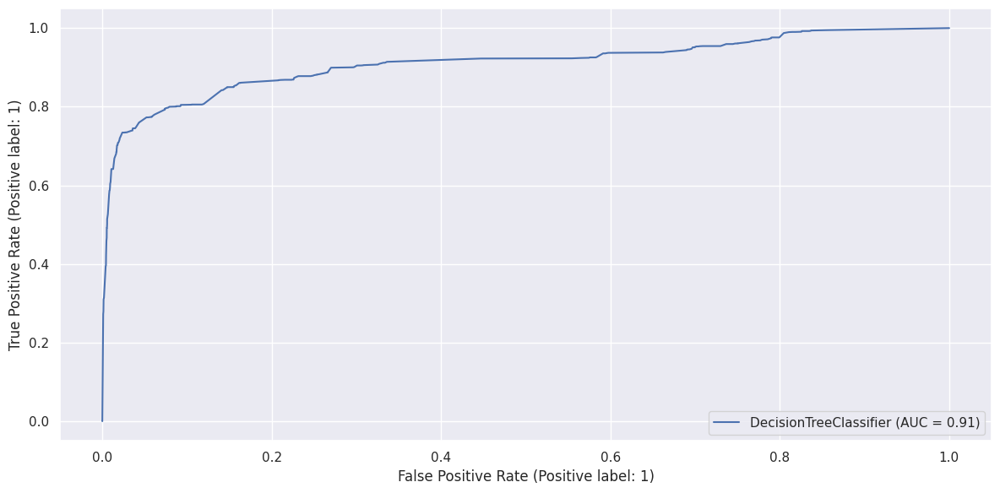

In [189]:
#AUC Score on final test data
metrics.RocCurveDisplay.from_estimator(dt_adasyn, X_final, y_final)
plt.show()

**It has a good auc score of 0.91**

### **Cost Benefit Analysis**

To do cost benefit analysis, we need to merge original datasets of train and test

In [190]:
train = pd.read_csv('/content/gdrive/MyDrive/Capstone Dataset/fraudTrain.csv')
test = pd.read_csv('/content/gdrive/MyDrive/Capstone Dataset/fraudTest.csv')

In [201]:
#merging both datasets
data = pd.concat([train, test], axis=0)
data.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


Part I: Analyse the dataset and find the following figures:
1.	Average number of transactions per month
2.	Average number of fraudulent transactions per month
3.	Average amount per fraudulent transaction


In [202]:
# The data is of 24 months
# Total transactions can be found by checking the shape of the original dataframe

avg_transactions_pm = data.shape[0]//24
print("1. Average number of transactions per month are:", avg_transactions_pm)

1. Average number of transactions per month are: 77183


In [203]:
#Total number of fraudulent transactions
data[data.is_fraud == 1]

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
2449,2449,2019-01-02 01:06:37,4613314721966,fraud_Rutherford-Mertz,grocery_pos,281.06,Jason,Murphy,M,542 Steve Curve Suite 011,...,35.9946,-81.7266,885,Soil scientist,1988-09-15,e8a81877ae9a0a7f883e15cb39dc4022,1325466397,36.430124,-81.179483,1
2472,2472,2019-01-02 01:47:29,340187018810220,"fraud_Jenkins, Hauck and Friesen",gas_transport,11.52,Misty,Hart,F,27954 Hall Mill Suite 575,...,29.4400,-98.4590,1595797,Horticultural consultant,1960-10-28,bc7d41c41103877b03232f03f1f8d3f5,1325468849,29.819364,-99.142791,1
2523,2523,2019-01-02 03:05:23,340187018810220,fraud_Goodwin-Nitzsche,grocery_pos,276.31,Misty,Hart,F,27954 Hall Mill Suite 575,...,29.4400,-98.4590,1595797,Horticultural consultant,1960-10-28,b98f12f4168391b2203238813df5aa8c,1325473523,29.273085,-98.836360,1
2546,2546,2019-01-02 03:38:03,4613314721966,fraud_Erdman-Kertzmann,gas_transport,7.03,Jason,Murphy,M,542 Steve Curve Suite 011,...,35.9946,-81.7266,885,Soil scientist,1988-09-15,397894a5c4c02e3c61c784001f0f14e4,1325475483,35.909292,-82.091010,1
2553,2553,2019-01-02 03:55:47,340187018810220,fraud_Koepp-Parker,grocery_pos,275.73,Misty,Hart,F,27954 Hall Mill Suite 575,...,29.4400,-98.4590,1595797,Horticultural consultant,1960-10-28,7863235a750d73a244c07f1fb7f0185a,1325476547,29.786426,-98.683410,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517197,517197,2020-12-22 22:05:48,2242176657877538,"fraud_Willms, Kris and Bergnaum",shopping_pos,1041.51,Travis,Daniel,M,1327 Rose Causeway Apt. 610,...,34.6323,-89.8855,14462,Database administrator,1959-03-03,35b0297dd026d2e9a75d024a5dec7955,1387749948,34.573471,-89.911011,1
517274,517274,2020-12-22 22:18:07,2242176657877538,fraud_Kuhn LLC,shopping_pos,868.09,Travis,Daniel,M,1327 Rose Causeway Apt. 610,...,34.6323,-89.8855,14462,Database administrator,1959-03-03,da7f67d7375f10a054a3d919448c45dd,1387750687,34.091227,-90.390612,1
517341,517341,2020-12-22 22:31:48,2242176657877538,"fraud_Mosciski, Ziemann and Farrell",shopping_net,1039.42,Travis,Daniel,M,1327 Rose Causeway Apt. 610,...,34.6323,-89.8855,14462,Database administrator,1959-03-03,25b076c7bcd70f272c1c5326bb234f4b,1387751508,34.628434,-90.284780,1
517529,517529,2020-12-22 23:06:03,2242176657877538,fraud_Bauch-Raynor,grocery_pos,289.27,Travis,Daniel,M,1327 Rose Causeway Apt. 610,...,34.6323,-89.8855,14462,Database administrator,1959-03-03,2df7d894868fbc99ec1d8b055585fc9d,1387753563,34.746063,-90.401093,1


In [204]:
# Fraudulent transactions are 9651 in total as seen from above output
# They are spread across 24 months

avg_fraudtrans_pm = data[data.is_fraud == 1].shape[0]//24
print("2. Average number of fraudulent transactions per month are:", avg_fraudtrans_pm)

2. Average number of fraudulent transactions per month are: 402


In [205]:
# Average amount of fraud is the total fraudulent amount divided by the total number of fraudulent transactions

avg_fraud_amt = data[data.is_fraud == 1].amt.sum()//data[data.is_fraud == 1].shape[0]
print("3. Average amount per fraudulent transactions is:", avg_fraud_amt)

3. Average amount per fraudulent transactions is: 530.0


Part II: Compare the cost incurred per month by the bank before and after the model deployment:


*   Cost incurred per month before the model was deployed = Average amount per fraudulent transaction * Average number of fraudulent transactions per month
*   Cost incurred per month after the model is built and deployed: <Use the test metric from the model evaluation part and the calculations performed in Part I to compute the values given below>

Let TF be the average number of transactions per month detected as fraudulent by the model and let the cost of providing customer executive support per fraudulent transaction detected by the model = $1.5



*   Total cost of providing customer support per month for fraudulent transactions detected by the model = 1.5 * TF.

Let FN be the average number of transactions per month that are fraudulent but not detected by the model


*   Cost incurred due to these fraudulent transactions left undetected by the model = Average amount per fraudulent transaction * FN


*   Therefore, the cost incurred per month after the model is built and deployed = 1.5*TF + Average amount per fraudulent transaction * FN


*   Final savings = Cost incurred before - Cost incurred after.


Note that you’re not including the model deployment cost since it will only be a one-time expenditure and you’re trying to gauge the long-term benefits of putting this model into practice.


In [206]:
# Calculating the cost incurred before deploying the model based on the first point descibed above:

cost_before_model = avg_fraud_amt*avg_fraudtrans_pm
cost_before_model

213060.0

In [212]:
# Let TF be the average number of transactions per month detected as fraudulent by the model
# Since the test dataframe has 7 months data, dividing by 7

TF = fraud_df.y_pred.sum()//7
print('TF = ',TF)
print("Total cost of providing customer support per month for fraudulent transactions detected by the model =", TF*1.5)

TF =  239
Total cost of providing customer support per month for fraudulent transactions detected by the model = 358.5


In [213]:
# Let FN be the average number of transactions per month that are fraudulent but not detected by the model
# Since the test dataframe has 7 months data, dividing by 7

FN = fraud_df[fraud_df.y_pred==0].is_fraud.sum()//7
print('FN = ',FN)
print("Cost incurred due to these fraudulent transactions left undetected by the model =", FN*avg_fraud_amt)

FN =  66
Cost incurred due to these fraudulent transactions left undetected by the model = 34980.0


In [210]:
# Cost incurred after the model is deployed:

cost_after_model = (TF*1.5) + (FN*avg_fraud_amt)
cost_after_model

35338.5

In [211]:
# Final savings = Cost incurred before - Cost incurred after

Final_Savings = int(cost_before_model - cost_after_model)
print("Final Savings after deploying the model are: $",Final_Savings)

Final Savings after deploying the model are: $ 177721
